<h1 style="text-align: center;">Deep Learning<br><br>Image Classification with CNN<br><br>Cat-Dog Classification Project<br><h1>

# Dataset Info

The Dogs vs. Cats dataset is a common computer vision dataset in which pictures are classified as either including a dog or a cat.

After the dataset is well studied, it can be used to understand and practice how to design, evaluate, and apply convolutional neural networks for image classification.

You will build a classifier with images and try to detect dogs versus cats using CNN.

Train set includes 12500 cat-5026 dog images, validation set includes 1219 cat-1071 dog images and test set includes 6897 cat and dogs images together.

# Import Libraries and Export Images from Zip_File

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread
import tensorflow as tf




#import warnings
#warnings.filterwarnings("ignore")
#warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
import tensorflow as tf

if tf.config.list_physical_devices("GPU"):
    print("GPU support is enabled for this session.")
else:
    print("CPU will be used for this session.")

GPU support is enabled for this session.


# Recognizing and Understanding Data

/Users/zaferyildirim/Desktop/catdog

import os, shutil

def reduce_validation_to_n(val_dir, train_dir, class_names, n_keep=1000):
    for cls in class_names:
        val_cls_dir   = os.path.join(val_dir, cls)
        train_cls_dir = os.path.join(train_dir, cls)
        os.makedirs(train_cls_dir, exist_ok=True)

        files = sorted([
            f for f in os.listdir(val_cls_dir)
            if f.lower().endswith(('.jpg', '.png'))
        ])

        # Kalan dosyaları belirle
        extra_files = files[n_keep:]

        # Geri taşı
        for f in extra_files:
            shutil.move(os.path.join(val_cls_dir, f), os.path.join(train_cls_dir, f))

        # Bilgi ver
        print(f"{cls}: {len(extra_files)} fazla dosya train klasörüne taşındı.")
        print(f"{cls}: validation klasöründe {n_keep} dosya bırakıldı.")

# Kullanım:
reduce_validation_to_n(
    val_dir=val_dir,
    train_dir=train_dir,
    class_names=['cat', 'dog'],
    n_keep=1000
)


In [3]:
import os                                              # ▶ Dosya sistemi işlemleri için
from collections import Counter                        # ▶ Boyut sayımı için
from PIL import Image                                  # ▶ Görüntü açma için
import numpy as np                                     # ▶
import matplotlib.pyplot as plt                        # ▶ 
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # ▶ DataGenerator

# ——————————————————————————————
# Base dizin tanımları
base_dir  = '/Users/zaferyildirim/Desktop/catdog'      # ▶ Ana dataset dizini
train_dir = os.path.join(base_dir, 'train')            # ▶ Eğitim verisi klasörü
val_dir   = os.path.join(base_dir, 'validation')       # ▶ Doğrulama verisi klasörü
test_dir  = os.path.join(base_dir, 'test')             # ▶ Test verisi klasörü (etiketsiz)

# ——————————————————————————————
# 1) Sınıf dağılımını sayma
def class_counts(directory):
    counts = {}
    for cls in ['cat', 'dog']:                          # ▶ Klasör adları
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path)
                 if f.lower().endswith(('.jpg', '.png'))]
        counts[cls] = len(files)                       # ▶ Dosya sayısını ata
    return counts

def class_counts_test(directory):
    test_count=0

    cls_path = os.path.join(directory)
    files = [f for f in os.listdir(cls_path)
             if f.lower().endswith(('.jpg', '.png'))]
    test_count = len(files)                       # ▶ Dosya sayısını ata
    return test_count
    
print("Train set:", class_counts(train_dir))           # ▶ Eğitim sınıf dağılımı
print("Validation set:", class_counts(val_dir))        # ▶ Doğrulama sınıf dağılımı
print("Test set (NO LABEL!!!!):", class_counts_test(test_dir))        # ▶ Doğrulama sınıf dağılımı


Train set: {'cat': 12719, 'dog': 5097}
Validation set: {'cat': 1000, 'dog': 1000}
Test set (NO LABEL!!!!): 6897


In [6]:
import os, shutil
import random

def create_subset_for_flow(train_dir, subset_dir, class_names, n_per_class=5000):
    if os.path.exists(subset_dir):
        shutil.rmtree(subset_dir)
    os.makedirs(subset_dir, exist_ok=True)

    for cls in class_names:
        src = os.path.join(train_dir, cls)
        dst = os.path.join(subset_dir, cls)
        os.makedirs(dst, exist_ok=True)

        files = [f for f in os.listdir(src) if f.lower().endswith(('.jpg', '.png'))]
        selected = random.sample(files, n_per_class)

        for f in selected:
            shutil.copy(os.path.join(src, f), os.path.join(dst, f))

        print(f"{cls}: {n_per_class} dosya {subset_dir} klasörüne kopyalandı.")

subset_dir = '/Users/zaferyildirim/Desktop/catdog/train_subset'

create_subset_for_flow(
    train_dir=train_dir,
    subset_dir=subset_dir,
    class_names=['cat', 'dog'],
    n_per_class=5097
)



cat: 5097 dosya /Users/zaferyildirim/Desktop/catdog/train_subset klasörüne kopyalandı.
dog: 5097 dosya /Users/zaferyildirim/Desktop/catdog/train_subset klasörüne kopyalandı.


In [7]:
# ——————————————————————————————
# 3) Ham veri boyutlarını inceleme (train)
size_counter = Counter()
for cls in ['cat', 'dog']:
    cls_path = os.path.join(train_dir, cls)
    for fname in os.listdir(cls_path):
        if not fname.lower().endswith(('.jpg', '.png')):
            continue
        with Image.open(os.path.join(cls_path, fname)) as img:
            size_counter[img.size] += 1                # ▶ Boyutu say

print("\nEn sık rastlanan 10 çözünürlük (train):")
for size, freq in size_counter.most_common(10):
    print(f"  {size[0]}×{size[1]} -> {freq} resim")



En sık rastlanan 10 çözünürlük (train):
  500×374 -> 2193 resim
  499×375 -> 2183 resim
  375×499 -> 181 resim
  499×333 -> 169 resim
  374×500 -> 164 resim
  319×240 -> 154 resim
  320×239 -> 141 resim
  500×332 -> 140 resim
  500×373 -> 78 resim
  349×262 -> 67 resim


In [8]:
# 2) Etiketsiz test dosyalarının listesi
unlabeled_test_files = [
    f for f in os.listdir(test_dir)
    if f.lower().endswith(('.jpg', '.png'))
]
print("Test (etiketsiz) toplam resim sayısı:", len(unlabeled_test_files))


Test (etiketsiz) toplam resim sayısı: 6897



Train’den örnekler:


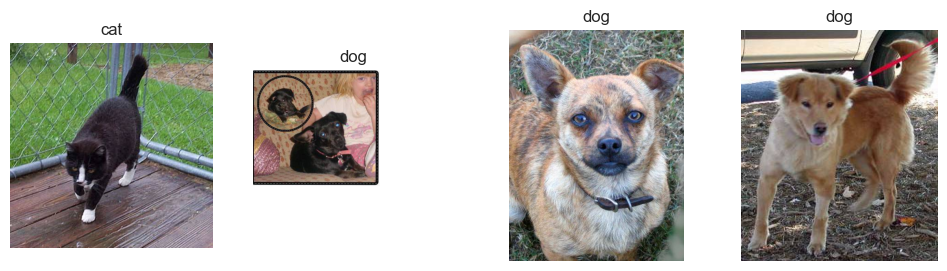

Validation’dan örnekler:


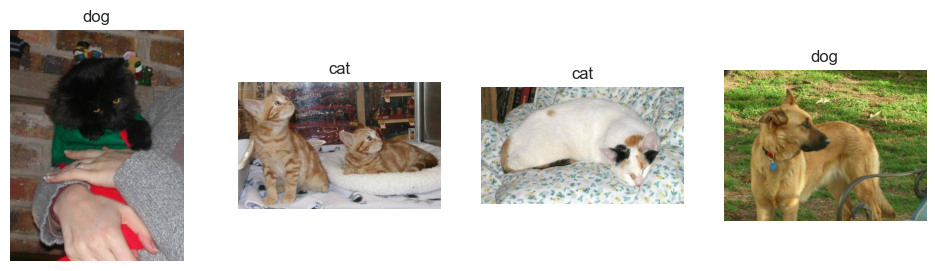

Test’den (etiketsiz) örnekler:


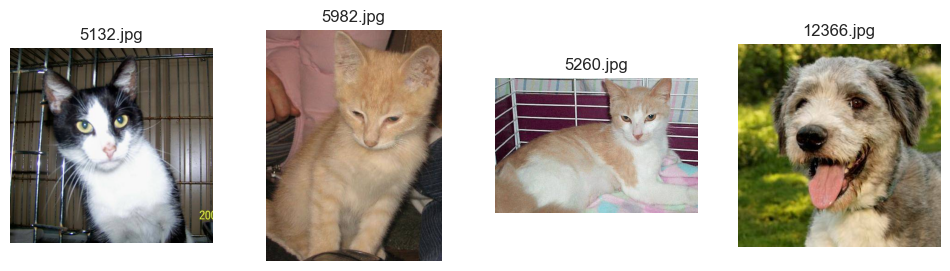

In [9]:
# 4) Örnek resimleri görselleştirme
def plot_labeled_samples(directory, n=4):
    fig, axes = plt.subplots(1, n, figsize=(12, 3))
    cls_list = np.random.choice(['cat', 'dog'], size=n)  # ▶ Rastgele sınıflar
    for i, c in enumerate(cls_list):
        folder = os.path.join(directory, c)
        fname  = np.random.choice(os.listdir(folder))
        img    = Image.open(os.path.join(folder, fname))
        axes[i].imshow(img)
        axes[i].set_title(c)
        axes[i].axis('off')
    plt.show()

def plot_unlabeled_samples(directory, n=4):
    fig, axes = plt.subplots(1, n, figsize=(12, 3))
    samples = np.random.choice(unlabeled_test_files, size=n, replace=False)  # ▶ Etiketsiz testlerden seç
    for i, fname in enumerate(samples):
        img = Image.open(os.path.join(directory, fname))
        axes[i].imshow(img)
        axes[i].set_title(fname)
        axes[i].axis('off')
    plt.show()

print("\nTrain’den örnekler:")
plot_labeled_samples(train_dir, n=4)

print("Validation’dan örnekler:")
plot_labeled_samples(val_dir, n=4)

print("Test’den (etiketsiz) örnekler:")
plot_unlabeled_samples(test_dir, n=4)


# Data Preprocessing

In [10]:

# 5a) Eğitim için normalize + augmentation

train_gen = ImageDataGenerator(
    rescale=1./255,           # ▶ Piksel değerlerini 0–1 aralığına çek
    rotation_range=15,        # ▶ ±15° rastgele döndürme
    width_shift_range=0.1,    # ▶ %10 yatay kaydırma
    height_shift_range=0.1,   # ▶ %10 dikey kaydırma
    zoom_range=0.1,           # ▶ %10 yakınlaştırma
    horizontal_flip=True,     # ▶ Yatay flip
    fill_mode='nearest',      # ▶ Kenarlardaki boşlukları doldur
    validation_split=0.2
)

# ——————————————————————————————
# 5b) Validation için sadece normalize
val_gen = ImageDataGenerator(rescale=1./255)  # ▶ Yalnızca normalize


batch_size = 32
target_size = (150, 150)

train_ds = train_gen.flow_from_directory(
    subset_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    shuffle=True,
    subset='training'
)

val_ds = train_gen.flow_from_directory(
    subset_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    shuffle=False,
    subset='validation'
)

print("Train samples (80% of train data):", train_ds.samples)
print("Validation samples (20% of train data):", val_ds.samples)


Found 8156 images belonging to 2 classes.
Found 2038 images belonging to 2 classes.
Train samples (80% of train data): 8156
Validation samples (20% of train data): 2038


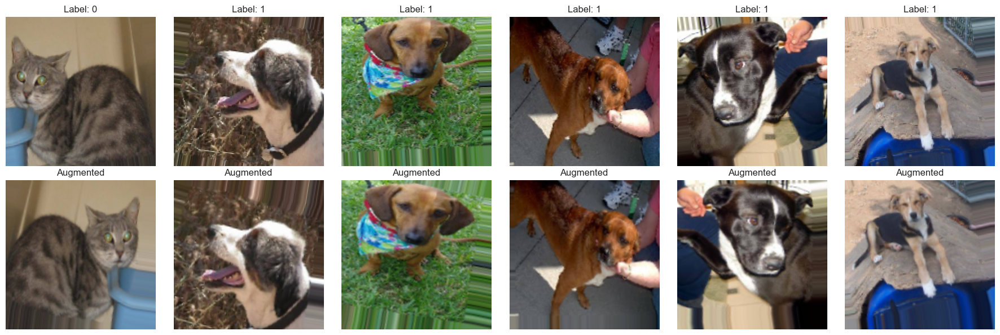

In [11]:
# 7) Augment edilmiş görselleri göster
x_batch, y_batch = next(train_ds)  # ▶ Bir batch çek
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
for i in range(6):
    axes[0, i].imshow(x_batch[i])                     # ▶ Normalize edilmiş halde
    axes[0, i].set_title(f"Label: {int(y_batch[i])}")
    axes[0, i].axis('off')

    axes[1, i].imshow(train_gen.random_transform(x_batch[i]))  # ▶ Ek augment
    axes[1, i].set_title("Augmented")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()


In [13]:

# Train sınıf dağılımı
train_labels = train_ds.classes  # 0: cat, 1: dog
train_cat = np.sum(train_labels == 0)
train_dog = np.sum(train_labels == 1)

# Validation sınıf dağılımı
val_labels = val_ds.classes
val_cat = np.sum(val_labels == 0)
val_dog = np.sum(val_labels == 1)

print(f"Train samples (80%): total={train_ds.samples}, cat={train_cat}, dog={train_dog}")
print(f"Validation samples (20%): total={val_ds.samples}, cat={val_cat}, dog={val_dog}")


Train samples (80%): total=8156, cat=4078, dog=4078
Validation samples (20%): total=2038, cat=1019, dog=1019


In [15]:
# 5b) Test için sadece normalize
test_gen = ImageDataGenerator(rescale=1./255)

test_ds = test_gen.flow_from_directory(
    val_dir,  # ▶ Artık test klasörü oldu
    target_size=target_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

print("Test samples (Val data, because test folder doesn't have labels):", test_ds.samples)



Found 2000 images belonging to 2 classes.
Test samples (Val data, because test folder doesn't have labels): 2000


# MODELING

In [19]:
from tensorflow.keras import models, layers

# ——————————————————————————————
# Model Architecture
model = models.Sequential(name='binary_cnn_custom')

# 1) Input Layer
model.add(layers.Input(shape=(150, 150, 3), name='input_layer'))
# ▶ Input: 150×150 RGB images

# 2) Convolutional Block 1
model.add(layers.Conv2D(32, (3, 3), activation='relu', name='conv1'))
model.add(layers.BatchNormalization(name='bn1'))
model.add(layers.MaxPooling2D((2, 2), name='pool1'))
# ▶ Extract low-level features

# 3) Convolutional Block 2
model.add(layers.Conv2D(64, (3, 3), activation='relu', name='conv2'))
model.add(layers.BatchNormalization(name='bn2'))
model.add(layers.MaxPooling2D((2, 2), name='pool2'))

# 4) Convolutional Block 3
model.add(layers.Conv2D(96, (3, 3), activation='relu', name='conv3'))
model.add(layers.BatchNormalization(name='bn3'))
model.add(layers.MaxPooling2D((2, 2), name='pool3'))

# 5) Convolutional Block 4
model.add(layers.Conv2D(128, (3, 3), activation='relu', name='conv4'))
model.add(layers.BatchNormalization(name='bn4'))
model.add(layers.MaxPooling2D((2, 2), name='pool4'))

# 6) Convolutional Block 5
model.add(layers.Conv2D(160, (3, 3), activation='relu', name='conv5'))
model.add(layers.BatchNormalization(name='bn5'))
model.add(layers.MaxPooling2D((2, 2), name='pool5'))

# 8) Flatten and Fully Connected Layers
model.add(layers.Flatten(name='flatten'))
# ▶ Converts spatial maps into a 1D feature vector

model.add(layers.Dense(256, activation='relu', name='dense1'))
model.add(layers.Dropout(0.5, name='dropout1'))  # ▶ Dropout 50% to reduce overfitting

model.add(layers.Dense(128, activation='relu', name='dense2'))
model.add(layers.Dropout(0.3, name='dropout2'))  # ▶ Dropout 30%

# 9) Output Layer
model.add(layers.Dense(1, activation='sigmoid', name='output'))
# ▶ Single neuron with sigmoid for binary classification

# ——————————————————————————————
# Compile the Model
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# ——————————————————————————————
# Show Model Summary
model.summary()


Model: "binary_cnn_custom"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 148, 148, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2 (BatchNormalization)        │ (None, 72, 72, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 34, 34, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3 (BatchNormalization)        │ (None, 34, 34, 96)     │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 17, 17, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 15, 15, 128)    │       110,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn4 (BatchNormalization)        │ (None, 15, 15, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool4 (MaxPooling2D)            │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 5, 5, 160)      │       184,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn5 (BatchNormalization)        │ (None, 5, 5, 160)      │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool5 (MaxPooling2D)            │ (None, 2, 2, 160)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 640)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 256)            │       164,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout2 (Dropout)              │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 569,025 (2.17 MB)

 Trainable params: 568,065 (2.17 MB)

 Non-trainable params: 960 (3.75 KB)

In [20]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# ——————————————————————————————
# 8) Callback’leri tanımla
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        'final_cat_dog_model_100epoch_2.keras',     # ▶ .keras uzantılı en iyi modeli sakla
        save_best_only=True,
        monitor='val_accuracy',
        verbose=1
    )
]


In [21]:

# ——————————————————————————————
# 9) Modeli eğit
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=callbacks
)



Epoch 1/100


2025-07-20 23:20:31.683931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


255/255 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.5468 - loss: 1.7636 
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to final_cat_dog_model_100epoch_2.keras
255/255 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - accuracy: 0.5468 - loss: 1.7631 - val_accuracy: 0.5000 - val_loss: 2.2638
Epoch 2/100
255/255 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5614 - loss: 1.4043 
Epoch 2: val_accuracy improved from 0.50000 to 0.52355, saving model to final_cat_dog_model_100epoch_2.keras
255/255 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5614 - loss: 1.4039 - val_accuracy: 0.5236 - val_loss: 1.4423
Epoch 3/100
255/255 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.5823 - loss: 0.9644 
Epoch 3: val_accuracy improved from 0.52355 to 0.64868, saving model to final_cat_dog_model_100epoch_2.keras
255/255 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - accuracy: 0.5823 - loss: 0.9642 - val_accuracy: 0.6487 - val_loss: 0.6299
Epoch 4/100
255/255 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy

In [22]:
# ——————————————————————————————
# 10) Eğitimi tamamladıktan sonra tüm modeli kaydet
#model.save('final_cat_dog_model_100epoch.keras')  # ▶ Klasör değil, tek .keras dosyası

# ——————————————————————————————
# 11) Daha sonra yüklemek için
from tensorflow.keras.models import load_model
model = load_model('final_cat_dog_model_100epoch_2.keras')

In [23]:
model.metrics_names

['loss', 'compile_metrics']

In [24]:
summary = pd.DataFrame(history.history)
summary.head(12)

,accuracy,loss,val_accuracy,val_loss
0,0.561,1.627,0.500,2.264
1,0.563,1.308,0.524,1.442
2,0.594,0.909,0.649,0.630
3,0.658,0.661,0.702,0.577
4,0.699,0.582,0.663,0.647
5,0.721,0.564,0.700,0.572
6,0.723,0.549,0.727,0.549
7,0.741,0.532,0.746,0.525
8,0.759,0.505,0.691,0.639
9,0.769,0.483,0.809,0.451


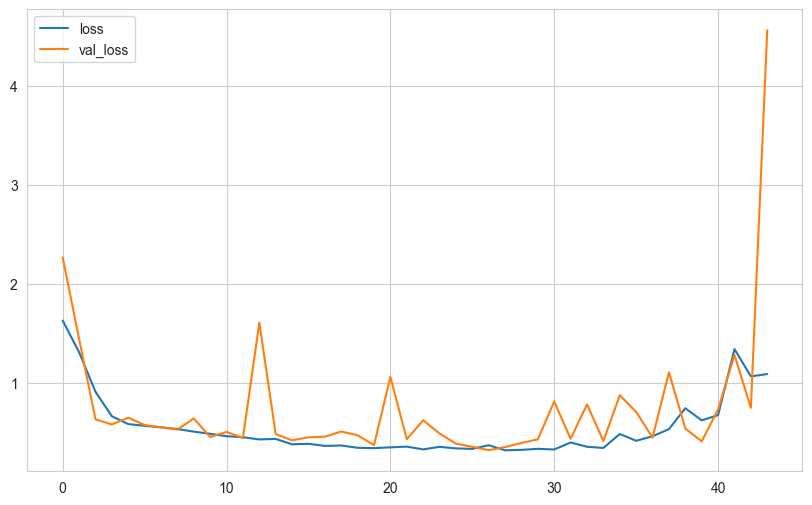

In [25]:
summary[["loss", "val_loss"]].plot()
plt.show()

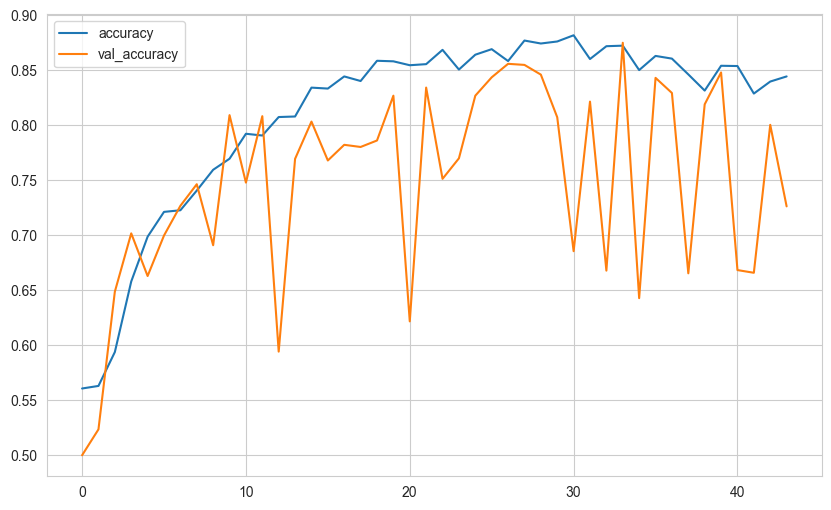

In [26]:
summary[["accuracy", "val_accuracy"]].plot()
plt.show()

In [27]:
from sklearn.metrics import classification_report, confusion_matrix



# Evaluation on Test Data 

In [28]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.4f}, Test Loss: {test_loss:.4f}")


/Users/zaferyildirim/data1/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.8521 - loss: 0.4845  
Test Accuracy: 0.8820, Test Loss: 0.4066


In [29]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np


In [30]:
# Gerçek etiketler
y_true = test_ds.classes

# Model tahminleri
y_probs = model.predict(test_ds)
y_pred = (y_probs > 0.5).astype("int32").flatten()


63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step 


In [31]:
# Classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=["cat", "dog"]))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_true, y_pred))



Classification Report:
              precision    recall  f1-score   support

         cat       0.91      0.85      0.88      1000
         dog       0.86      0.91      0.89      1000

    accuracy                           0.88      2000
   macro avg       0.88      0.88      0.88      2000
weighted avg       0.88      0.88      0.88      2000


Confusion Matrix:
[[852 148]
 [ 88 912]]


In [32]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import os

# Test klasöründeki tüm dosya path'leri
filepaths = [os.path.join(test_dir, fname)
             for fname in os.listdir(test_dir)
             if fname.lower().endswith(('.jpg', '.png'))]

print("LEN filepaths: ", len(filepaths))
# DataFrame yap
df = pd.DataFrame({'filename': filepaths})

# DataGenerator
test_gen = ImageDataGenerator(rescale=1./255)

# Veri setini oluştur
inference_ds = test_gen.flow_from_dataframe(
    dataframe=df,
    x_col='filename',         # 👈 burada path’ler var
    y_col=None,               # 👈 çünkü label yok
    class_mode=None,
    target_size=target_size,
    shuffle=False,
    batch_size=32
)


LEN filepaths:  6897
Found 6897 validated image filenames.


In [33]:
len(inference_ds[0])

32

(150, 150, 3)


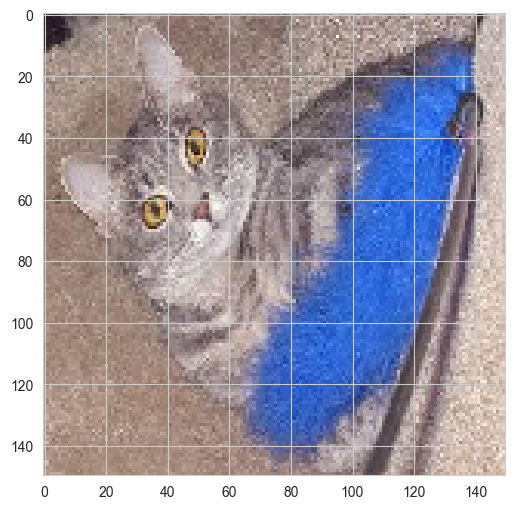

In [34]:
my_image = inference_ds[0][1]
print(my_image.shape)
plt.imshow(my_image)
plt.show()

In [35]:
image_prediction = model.predict(my_image.reshape(1, 150, 150, 3))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


In [36]:
image_prediction

array([[5.4094377e-14]], dtype=float32)

In [37]:
if image_prediction > 0.5:
    print("dog")
else:
    print("cat")


cat


(150, 150, 3)


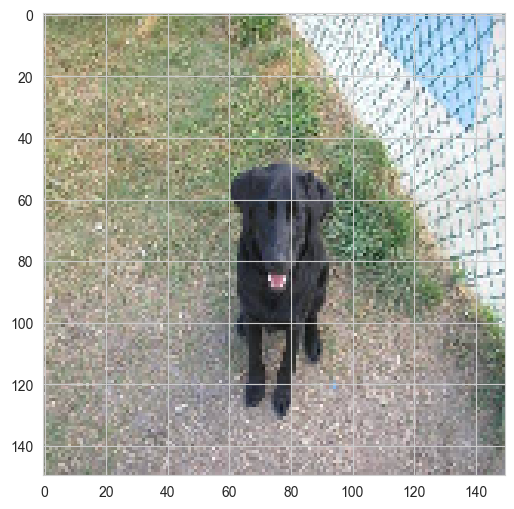

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[0.9969326]]
dog


(150, 150, 3)


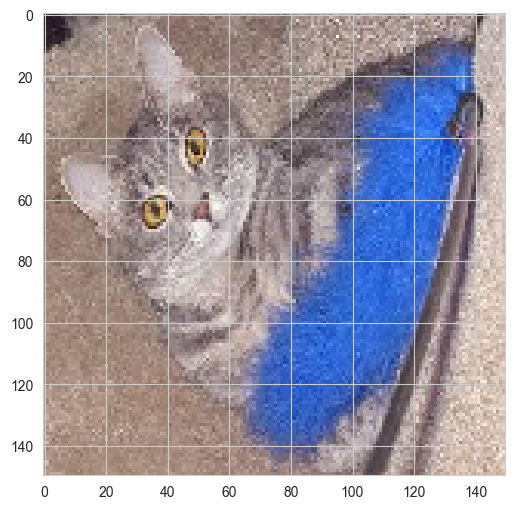

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[5.4094377e-14]]
cat


(150, 150, 3)


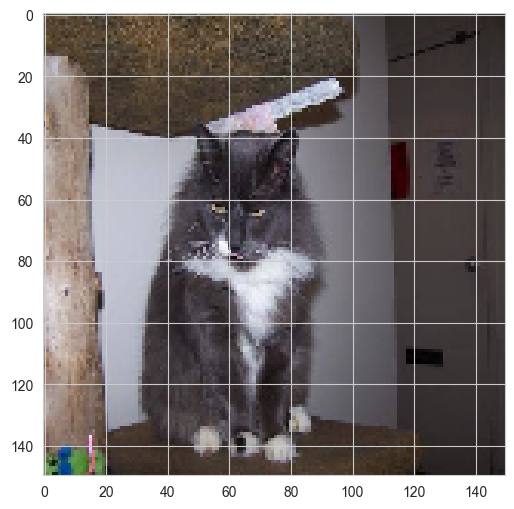

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[8.629968e-05]]
cat


(150, 150, 3)


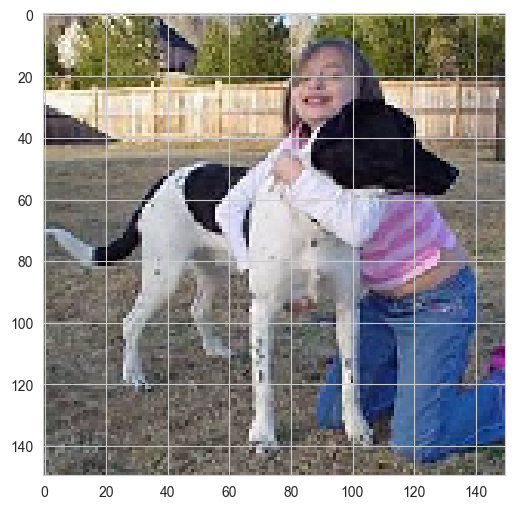

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[0.9999999]]
dog


(150, 150, 3)


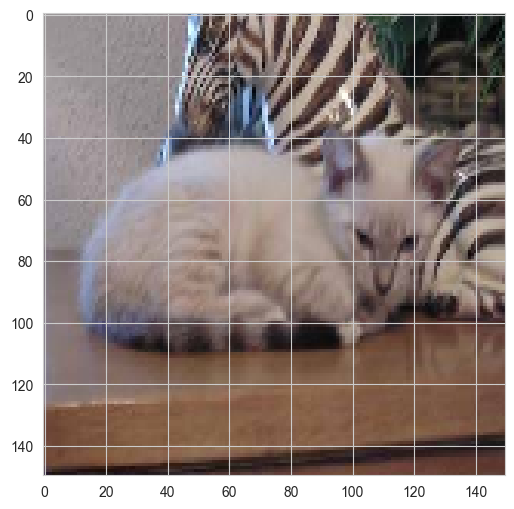

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.00270424]]
cat


(150, 150, 3)


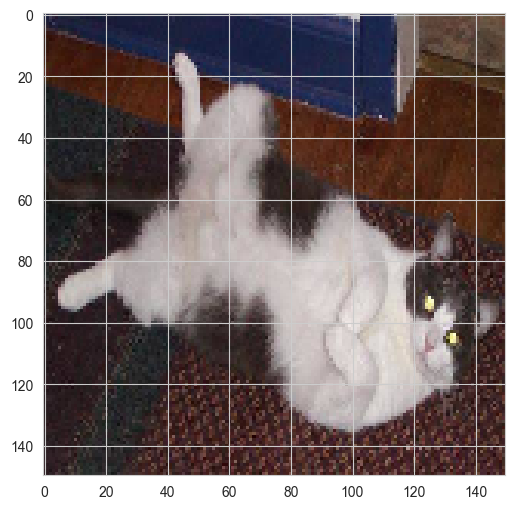

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.00040131]]
cat


(150, 150, 3)


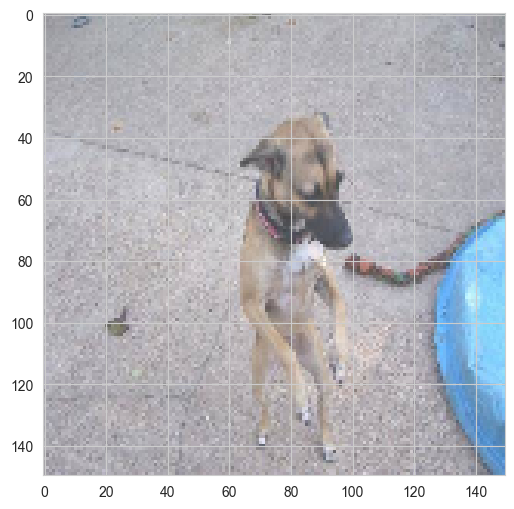

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.99357927]]
dog


(150, 150, 3)


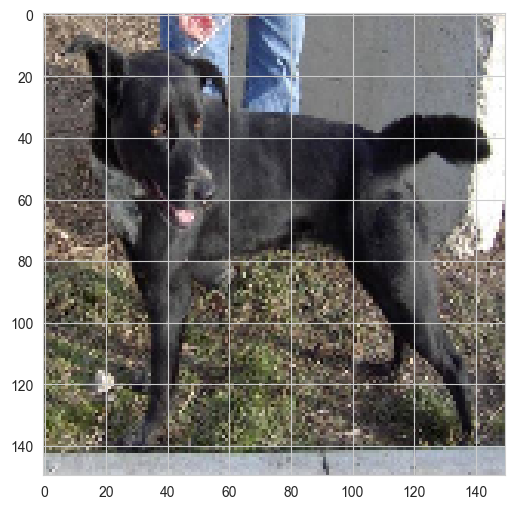

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[0.3878359]]
cat


(150, 150, 3)


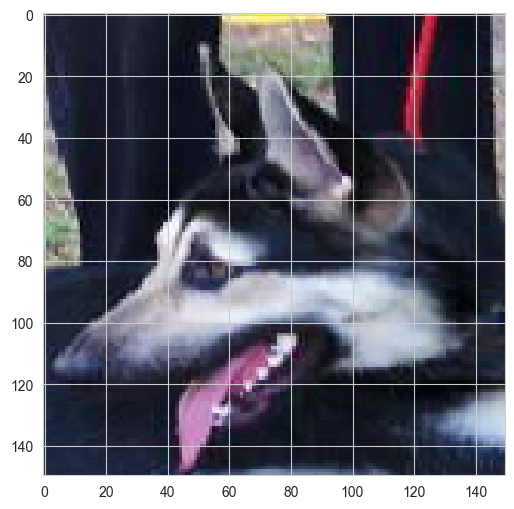

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.91499215]]
dog


(150, 150, 3)


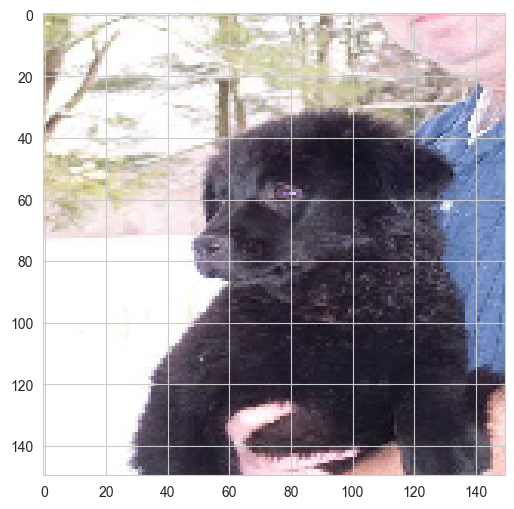

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.8688971]]
dog


(150, 150, 3)


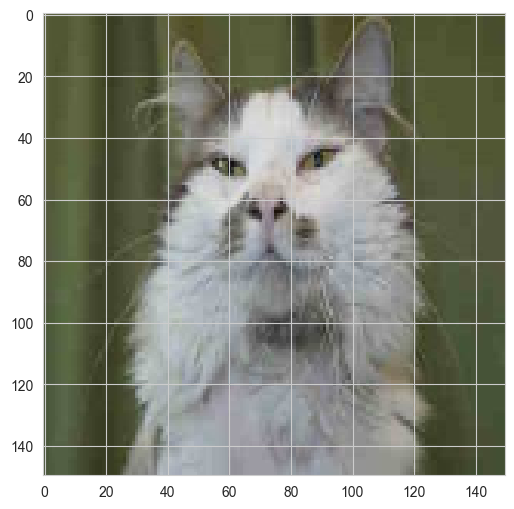

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[1.7154494e-05]]
cat


(150, 150, 3)


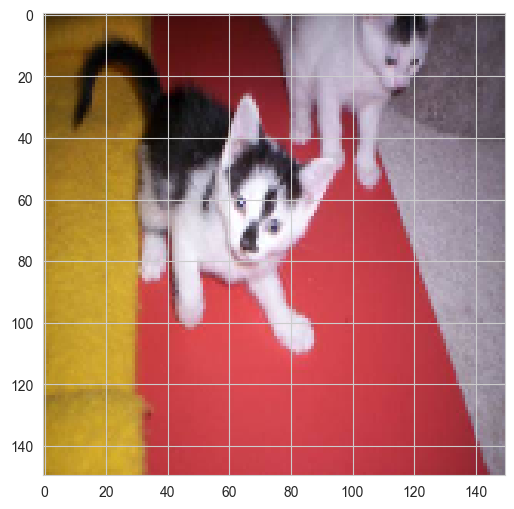

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.03568251]]
cat


(150, 150, 3)


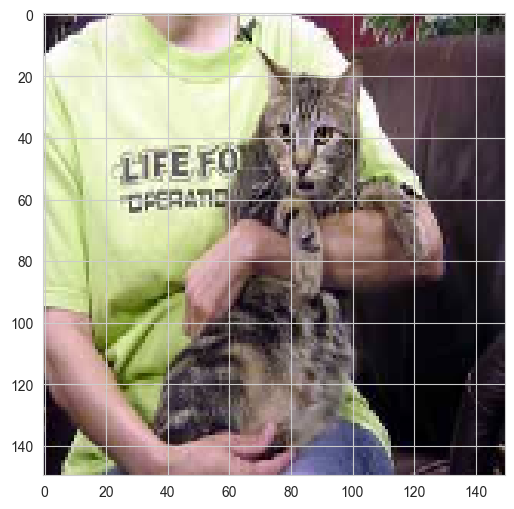

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[2.470006e-07]]
cat


(150, 150, 3)


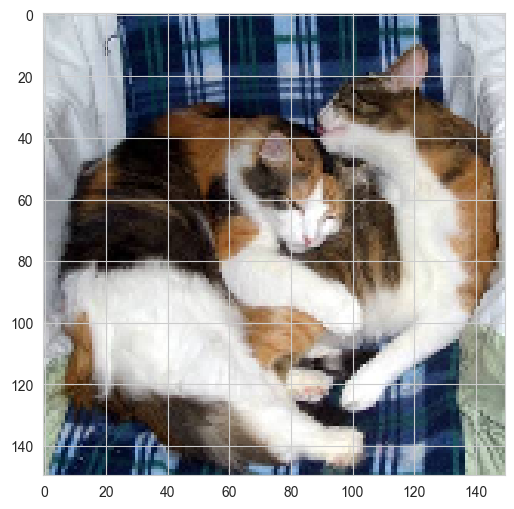

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[0.85544795]]
dog


(150, 150, 3)


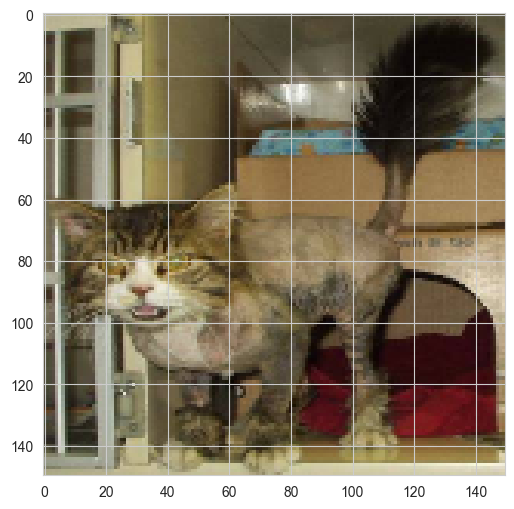

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.00037241]]
cat


(150, 150, 3)


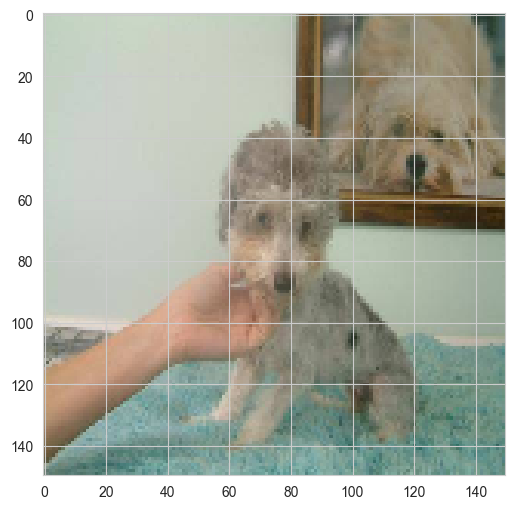

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[0.15761451]]
cat


(150, 150, 3)


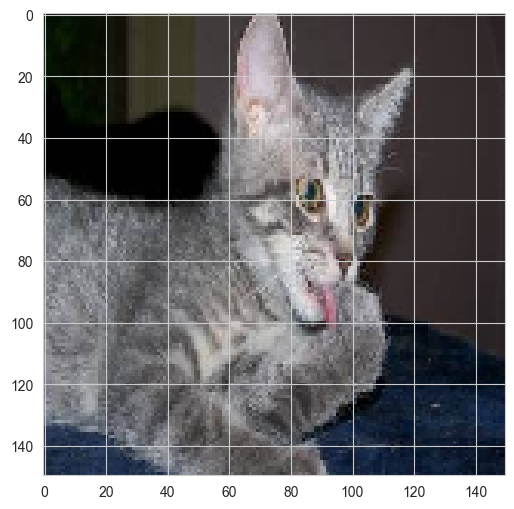

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[7.556412e-07]]
cat


(150, 150, 3)


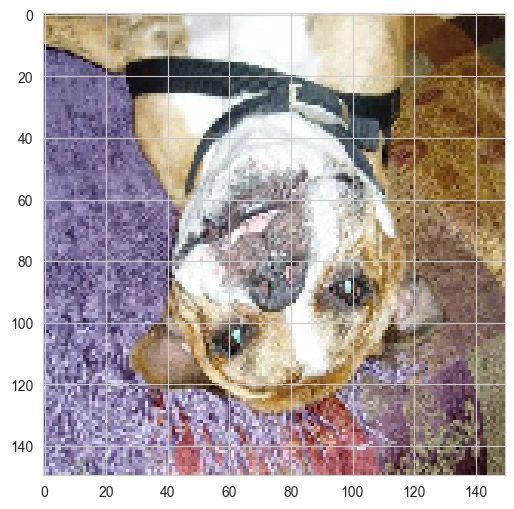

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.9999988]]
dog


(150, 150, 3)


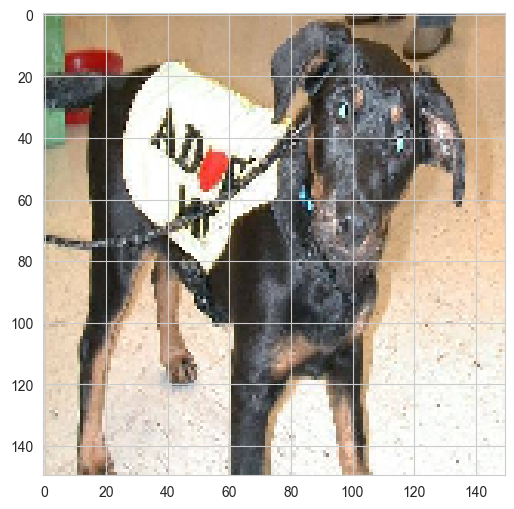

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.9999974]]
dog


(150, 150, 3)


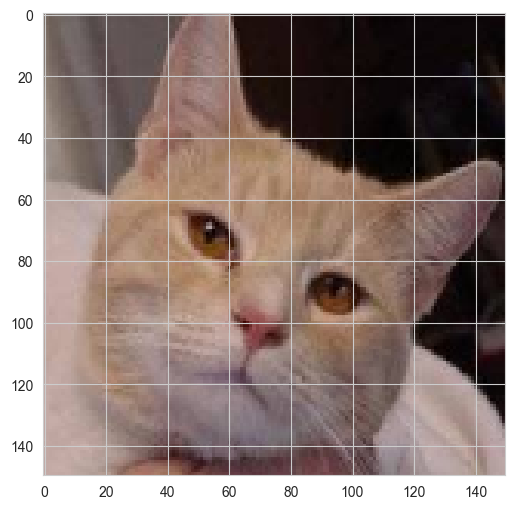

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.01866345]]
cat


(150, 150, 3)


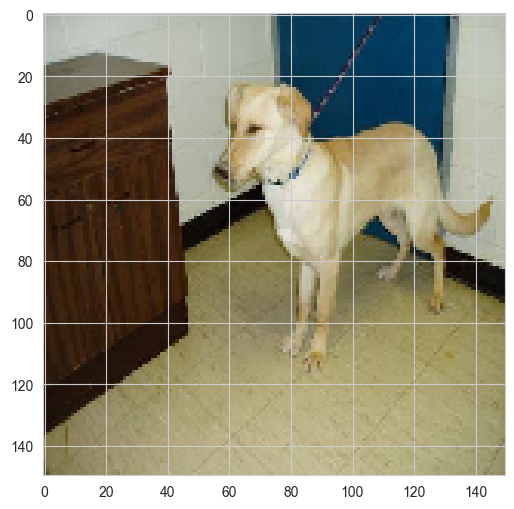

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.97298944]]
dog


(150, 150, 3)


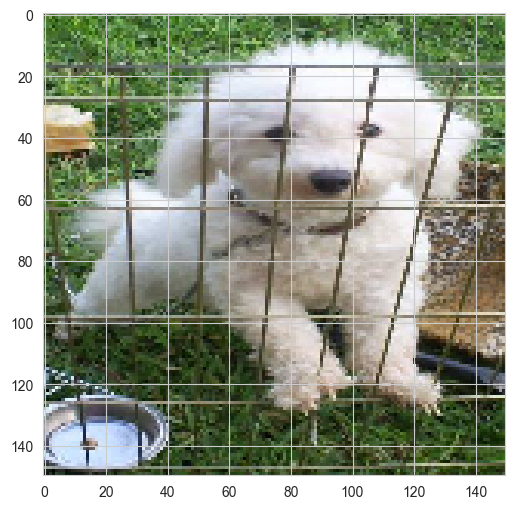

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.99592966]]
dog


(150, 150, 3)


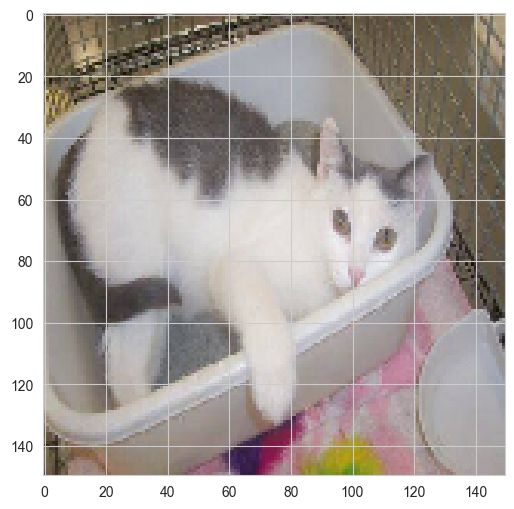

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.00080804]]
cat


(150, 150, 3)


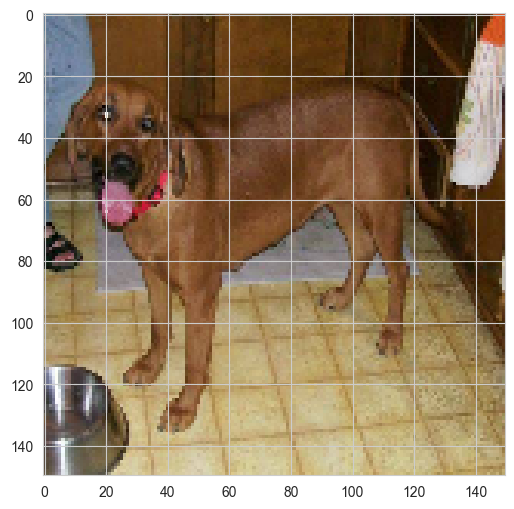

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.99999654]]
dog


(150, 150, 3)


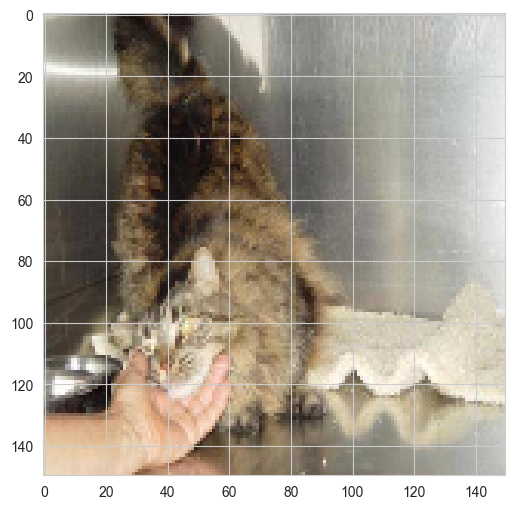

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.5830536]]
dog


(150, 150, 3)


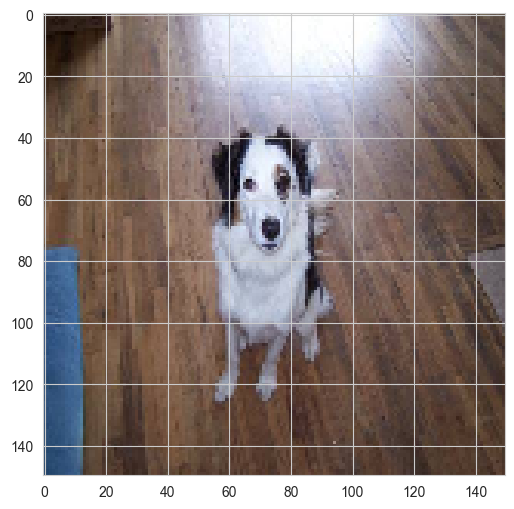

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.9998785]]
dog


(150, 150, 3)


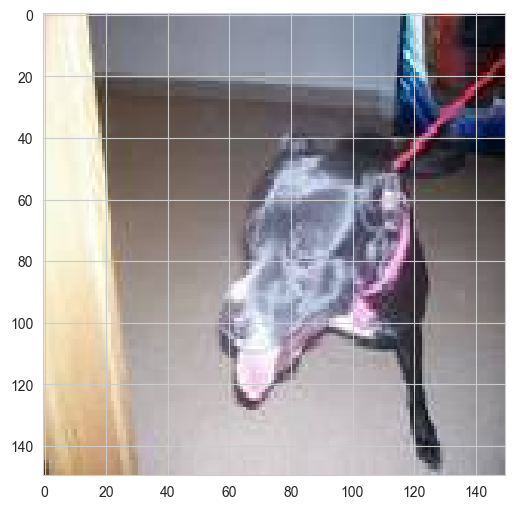

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.8347219]]
dog


(150, 150, 3)


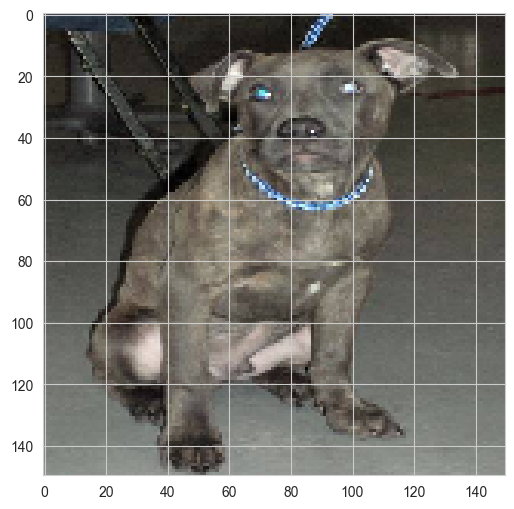

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.9999999]]
dog


(150, 150, 3)


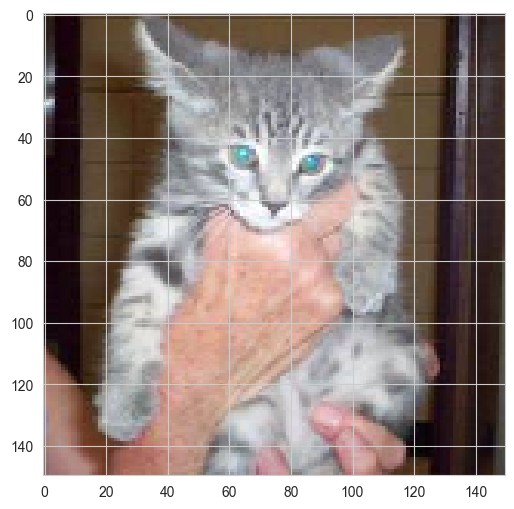

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[1.489875e-13]]
cat


(150, 150, 3)


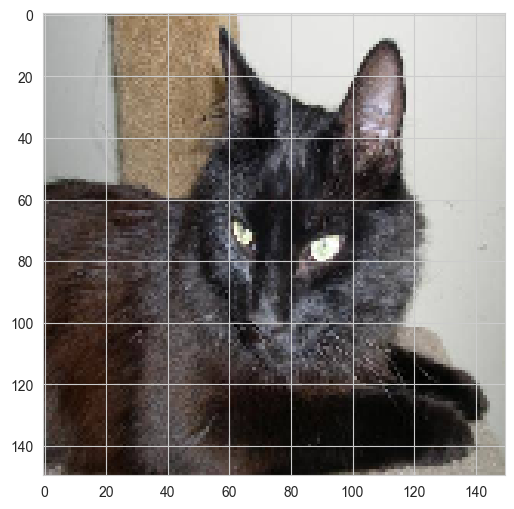

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[[4.3883947e-08]]
cat


(150, 150, 3)


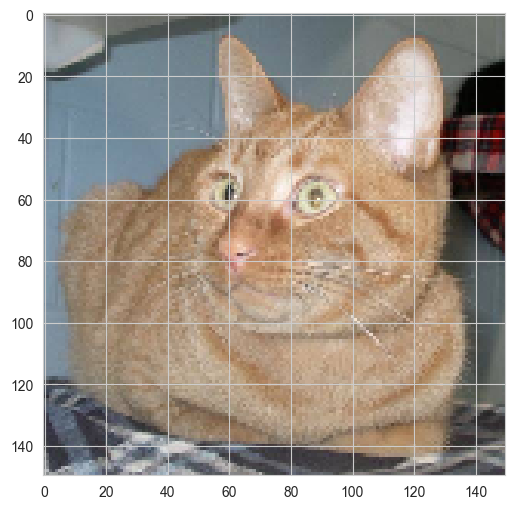

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.28409085]]
cat


(150, 150, 3)


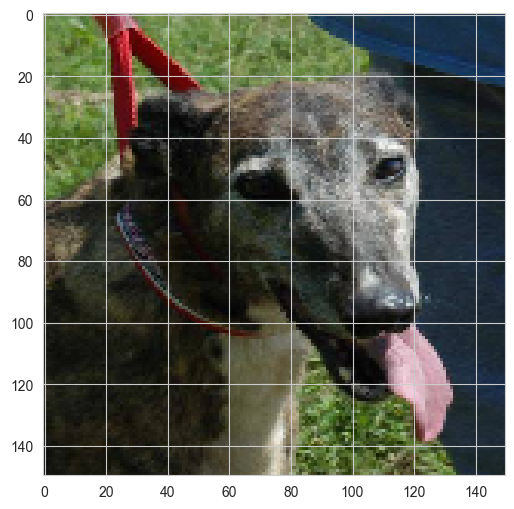

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[[0.91439235]]
dog




In [38]:
for anarray in inference_ds[0]:
    my_image = anarray
    print(my_image.shape)
    plt.imshow(my_image)
    plt.show()

    image_prediction = model.predict(my_image.reshape(1, 150, 150, 3))

    print(image_prediction)
    if image_prediction > 0.5:
        print("dog")
    else:
        print("cat")

    print("\n")


# Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


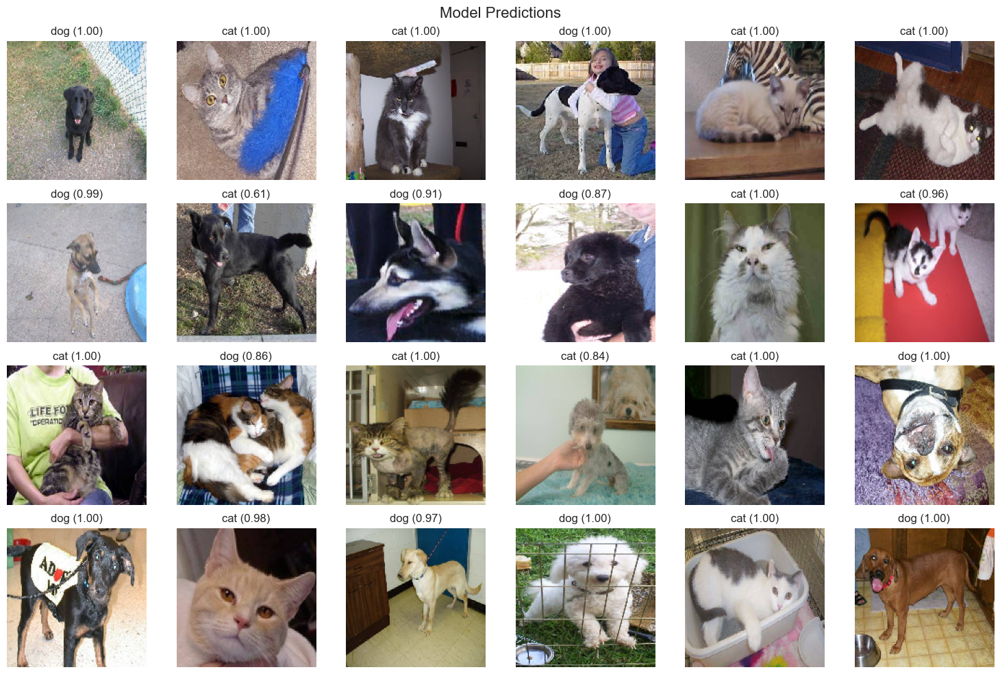

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 
sns.set_style("whitegrid")

# İlk batch'i al
images = inference_ds[0]  # batch_size kadar image döner (default 32)

plt.figure(figsize=(15, 10))  # grid boyutu

for i, img in enumerate(images[:24]):  # ilk 9 görseli gösterelim
    pred = model.predict(img.reshape(1, 150, 150, 3))[0][0]  # olasılık
    label = "dog" if pred > 0.5 else "cat"
    conf = pred if pred > 0.5 else 1 - pred

    # Grid çizimi
    plt.subplot(4, 6, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{label} ({conf:.2f})", fontsize=12)

plt.suptitle("Model Predictions", fontsize=16)
plt.tight_layout()
plt.show()


LEN filepaths: 6897
Found 24 validated image filenames.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


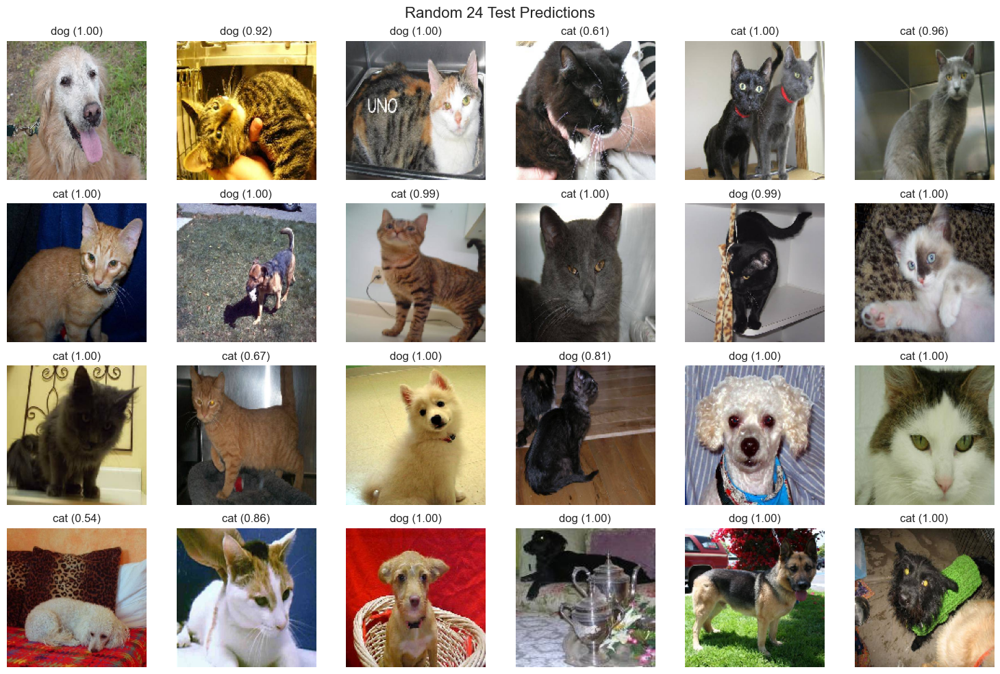

In [40]:
import random
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 📂 Tüm dosya pathlerini topla
filepaths = [os.path.join(test_dir, fname)
             for fname in os.listdir(test_dir)
             if fname.lower().endswith(('.jpg', '.png'))]

print("LEN filepaths:", len(filepaths))

# 🎯 Rastgele 24 dosya seç
#random.seed(42)  # İstersen sabitle
selected_paths = random.sample(filepaths, 24)

# 🔁 DataFrame yap
df_sample = pd.DataFrame({'filename': selected_paths})

# 🔄 ImageDataGenerator
test_gen = ImageDataGenerator(rescale=1./255)

# Sadece bu 24 görüntüyü yükle
inference_ds = test_gen.flow_from_dataframe(
    dataframe=df_sample,
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=target_size,
    shuffle=False,
    batch_size=1  # her seferde 1 image döner
)

# 🖼️ Görselleştirme
sns.set_style("whitegrid")
plt.figure(figsize=(15, 10))

for i in range(24):
    img_batch = inference_ds[i]             # shape: (1, 150, 150, 3)
    img = img_batch[0]                      # shape: (150, 150, 3)
    pred = model.predict(img_batch)[0][0]   # direkt predict
    label = "dog" if pred > 0.5 else "cat"
    conf = pred if pred > 0.5 else 1 - pred

    plt.subplot(4, 6, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{label} ({conf:.2f})", fontsize=12)

plt.suptitle("Random 24 Test Predictions", fontsize=16)
plt.tight_layout()
plt.show()
